In [270]:
import pandas as pd
from datetime import date
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.preprocessing import MinMaxScaler
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout,LSTM,Activation,RepeatVector
from feature_engine.timeseries.forecasting import LagFeatures, WindowFeatures, ExpandingWindowFeatures
from statsmodels.graphics.tsaplots import plot_acf
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier

In [271]:
df = pd.read_csv('m-hsmort7112.txt', sep=' ')

In [272]:
df.head()

,year,mon,hs,mort
0,1971,4,1986,7.31
1,1971,5,2049,7.43
2,1971,6,2026,7.53
3,1971,7,2083,7.60
4,1971,8,2158,7.70


In [273]:
df['Date'] = df['year'].astype(str)+' /'+df['mon'].astype(str)

In [274]:
df_new = df[['Date', 'hs','mort']]
df_new

,Date,hs,mort
0,1971 /4,1986,7.31
1,1971 /5,2049,7.43
2,1971 /6,2026,7.53
3,1971 /7,2083,7.60
4,1971 /8,2158,7.70
...,...,...,...
487,2011 /11,702,3.99
488,2011 /12,681,3.96
489,2012 /1,714,3.92
490,2012 /2,694,3.89


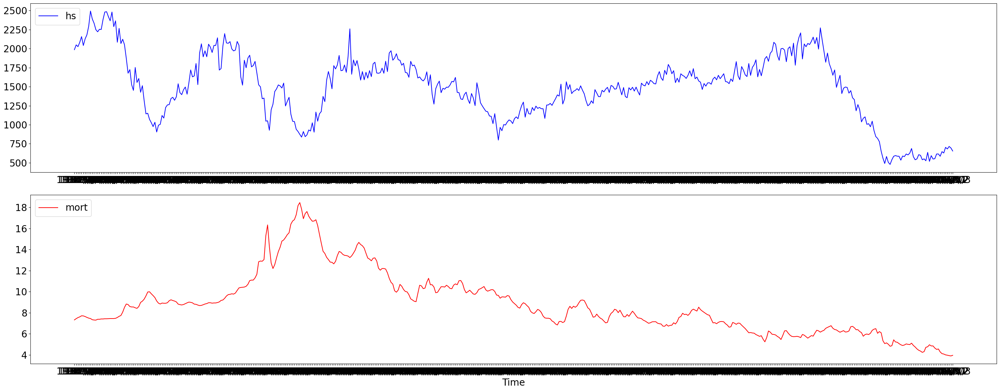

In [275]:
plt.figure(figsize=(30,12))
plt.rcParams["font.size"]="20"
plt.subplot(2,1,1)
plt.plot(df_new['Date'],df_new['hs'],label='hs',color='b')
plt.legend(loc='upper left')

plt.subplot(2,1,2)
plt.plot(df_new['Date'],df_new['mort'],label='mort',color='r')
plt.legend(loc='upper left')

plt.xlabel('Time')
plt.tight_layout()
plt.show()

In [276]:
df_new['Date'] = pd.to_datetime(df_new['Date'])
df_new['Date']

C:\Users\User\AppData\Local\Temp\ipykernel_8452\35616042.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['Date'] = pd.to_datetime(df_new['Date'])


0     1971-04-01
1     1971-05-01
2     1971-06-01
3     1971-07-01
4     1971-08-01
         ...    
487   2011-11-01
488   2011-12-01
489   2012-01-01
490   2012-02-01
491   2012-03-01
Name: Date, Length: 492, dtype: datetime64[ns]

In [277]:
df_ = df_new.copy()
df_

,Date,hs,mort
0,1971-04-01,1986,7.31
1,1971-05-01,2049,7.43
2,1971-06-01,2026,7.53
3,1971-07-01,2083,7.60
4,1971-08-01,2158,7.70
...,...,...,...
487,2011-11-01,702,3.99
488,2011-12-01,681,3.96
489,2012-01-01,714,3.92
490,2012-02-01,694,3.89


In [278]:
#Date Time Features
df_['year']  = df_['Date'].dt.year
df_['month']  = df_['Date'].dt.month

In [279]:
#Lag features
df_[f"hs_lag_1"] = df_["hs"].shift(periods=1)
df_[f"hs_lag_2"] = df_["hs"].shift(periods=2)
df_[f"hs_lag_3"] = df_["hs"].shift(periods=3)
df_[f"hs_lag_4"] = df_["hs"].shift(periods=4)
df_[f"hs_lag_5"] = df_["hs"].shift(periods=5)
df_[f"hs_lag_6"] = df_["hs"].shift(periods=6)
df_[f"hs_lag_7"] = df_["hs"].shift(periods=7)
df_[f"hs_lag_8"] = df_["hs"].shift(periods=8)
df_[f"hs_lag_12"] = df_["hs"].shift(periods=12)
df_[f"hs_lag_14"] = df_["hs"].shift(periods=14)
df_[f"hs_lag_16"] = df_["hs"].shift(periods=16)
df_[f"hs_lag_18"] = df_["hs"].shift(periods=18)
df_[f"hs_lag_20"] = df_["hs"].shift(periods=20)
df_[f"hs_lag_22"] = df_["hs"].shift(periods=22)
df_[f"hs_lag_24"] = df_["hs"].shift(periods=24)
df_[f"hs_lag_28"] = df_["hs"].shift(periods=28)
df_[f"hs_lag_30"] = df_["hs"].shift(periods=30)


In [280]:
#Lag features
df_[f"mort_lag_1"] = df_["mort"].shift(periods=1)
df_[f"mort_lag_2"] = df_["mort"].shift(periods=2)
df_[f"mort_lag_3"] = df_["mort"].shift(periods=3)
df_[f"mort_lag_4"] = df_["mort"].shift(periods=4)
df_[f"mort_lag_5"] = df_["mort"].shift(periods=5)
df_[f"mort_lag_6"] = df_["mort"].shift(periods=6)
df_[f"mort_lag_7"] = df_["mort"].shift(periods=7)
df_[f"mort_lag_8"] = df_["mort"].shift(periods=8)
df_[f"mort_lag_12"] = df_["mort"].shift(periods=12)
df_[f"mort_lag_14"] = df_["mort"].shift(periods=14)
df_[f"mort_lag_16"] = df_["mort"].shift(periods=16)
df_[f"mort_lag_18"] = df_["mort"].shift(periods=18)
df_[f"mort_lag_20"] = df_["mort"].shift(periods=20)
df_[f"mort_lag_22"] = df_["mort"].shift(periods=22)
df_[f"mort_lag_24"] = df_["mort"].shift(periods=24)
df_[f"mort_lag_28"] = df_["mort"].shift(periods=28)
df_[f"mort_lag_30"] = df_["mort"].shift(periods=30)


In [281]:
#Rolling window feature
df_['rolling_mean_hs_7'] = df_['hs'].rolling(window=7).mean()
df_['rolling_mean_hs_12'] = df_['hs'].rolling(window=12).mean()
df_['rolling_mean_hs_16'] = df_['hs'].rolling(window=16).mean()
df_['rolling_mean_hs_20'] = df_['hs'].rolling(window=20).mean()
df_['rolling_mean_hs_20'] = df_['hs'].rolling(window=24).mean()
df_['rolling_mean_hs_20'] = df_['hs'].rolling(window=28).mean()
df_['rolling_mean_hs_20'] = df_['hs'].rolling(window=32).mean()
df_['rolling_mean_hs_40'] = df_['hs'].rolling(window=40).mean()
df_['rolling_mean_hs_80'] = df_['hs'].rolling(window=80).mean()
df_['rolling_mean_hs_100'] = df_['hs'].rolling(window=100).mean()
df_['rolling_mean_hs_200'] = df_['hs'].rolling(window=200).mean()

In [282]:
df_['rolling_mean_mort_7'] = df_['mort'].rolling(window=7).mean()
df_['rolling_mean_mort_12'] = df_['mort'].rolling(window=12).mean()
df_['rolling_mean_mort_16'] = df_['mort'].rolling(window=16).mean()
df_['rolling_mean_mort_20'] = df_['mort'].rolling(window=20).mean()
df_['rolling_mean_mort_24'] = df_['mort'].rolling(window=24).mean()
df_['rolling_mean_mort_24'] = df_['mort'].rolling(window=28).mean()
df_['rolling_mean_mort_24'] = df_['mort'].rolling(window=32).mean()
df_['rolling_mean_mort_40'] = df_['mort'].rolling(window=40).mean()
df_['rolling_mean_mort_80'] = df_['mort'].rolling(window=80).mean()
df_['rolling_mean_mort_100'] = df_['mort'].rolling(window=100).mean()
df_['rolling_mean_mort_200'] = df_['mort'].rolling(window=200).mean()

In [283]:
#Expanding Window feature
df_['expanding_mean_mort_7'] = df_['mort'].expanding(7).mean()
df_['expanding_mean_mort_12'] = df_['mort'].expanding(12).mean()
df_['expanding_mean_mort_16'] = df_['mort'].expanding(16).mean()
df_['expanding_mean_mort_20'] = df_['mort'].expanding(20).mean()
df_['expanding_mean_mort_24'] = df_['mort'].expanding(24).mean()
df_['expanding_mean_mort_28'] = df_['mort'].expanding(28).mean()
df_['expanding_mean_mort_40'] = df_['mort'].expanding(40).mean()
df_['expanding_mean_mort_80'] = df_['mort'].expanding(80).mean()
df_['expanding_mean_mort_100'] = df_['mort'].expanding(100).mean()
df_['expanding_mean_mort_200'] = df_['mort'].expanding(200).mean()

In [284]:
#Expanding Window feature
df_['expanding_mean_hs_7'] = df_['hs'].expanding(7).mean()
df_['expanding_mean_hs_12'] = df_['hs'].expanding(12).mean()
df_['expanding_mean_hs_16'] = df_['hs'].expanding(16).mean()
df_['expanding_mean_hs_20'] = df_['hs'].expanding(20).mean()
df_['expanding_mean_hs_24'] = df_['hs'].expanding(24).mean()
df_['expanding_mean_hs_28'] = df_['hs'].expanding(28).mean()
df_['expanding_mean_hs_40'] = df_['hs'].expanding(40).mean()
df_['expanding_mean_hs_80'] = df_['hs'].expanding(80).mean()
df_['expanding_mean_hs_100'] = df_['hs'].expanding(100).mean()
df_['expanding_mean_hs_200'] = df_['hs'].expanding(200).mean()

In [285]:
#Remove seasonality using differencing
df_['hs_diff_1'] = df_['hs'] - df_["hs"].shift(periods=1)
df_['hs_diff_2'] = df_['hs'] - df_["hs"].shift(periods=2)
df_['hs_diff_3'] = df_['hs'] - df_["hs"].shift(periods=3)
df_['hs_diff_4'] = df_['hs'] - df_["hs"].shift(periods=4)
df_['hs_diff_7'] = df_['hs'] - df_["hs"].shift(periods=7)
df_['hs_diff_12'] = df_['hs'] - df_["hs"].shift(periods=12)


df_['mort_diff_1'] = df_['mort'] - df_["mort"].shift(periods=1)
df_['mort_diff_2'] = df_['mort'] - df_["mort"].shift(periods=2)
df_['mort_diff_3'] = df_['mort'] - df_["mort"].shift(periods=3)
df_['mort_diff_4'] = df_['mort'] - df_["mort"].shift(periods=4)
df_['mort_diff_7'] = df_['mort'] - df_["mort"].shift(periods=7)
df_['mort_diff_12'] = df_['mort'] - df_["mort"].shift(periods=12)



In [286]:
df_

,Date,hs,mort,year,month,hs_lag_1,hs_lag_2,hs_lag_3,hs_lag_4,hs_lag_5,...,hs_diff_3,hs_diff_4,hs_diff_7,hs_diff_12,mort_diff_1,mort_diff_2,mort_diff_3,mort_diff_4,mort_diff_7,mort_diff_12
0,1971-04-01,1986,7.31,1971,4,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1971-05-01,2049,7.43,1971,5,1986.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.12,NaN,NaN,NaN,NaN,NaN
2,1971-06-01,2026,7.53,1971,6,2049.0,1986.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.10,0.22,NaN,NaN,NaN,NaN
3,1971-07-01,2083,7.60,1971,7,2026.0,2049.0,1986.0,NaN,NaN,...,97.0,NaN,NaN,NaN,0.07,0.17,0.29,NaN,NaN,NaN
4,1971-08-01,2158,7.70,1971,8,2083.0,2026.0,2049.0,1986.0,NaN,...,109.0,172.0,NaN,NaN,0.10,0.17,0.27,0.39,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
487,2011-11-01,702,3.99,2011,11,628.0,646.0,585.0,615.0,615.0,...,117.0,87.0,153.0,151.0,-0.08,-0.12,-0.28,-0.56,-0.85,-0.31
488,2011-12-01,681,3.96,2011,12,702.0,628.0,646.0,585.0,615.0,...,35.0,96.0,128.0,155.0,-0.03,-0.11,-0.15,-0.31,-0.68,-0.75
489,2012-01-01,714,3.92,2012,1,681.0,702.0,628.0,646.0,585.0,...,86.0,68.0,99.0,78.0,-0.04,-0.07,-0.15,-0.19,-0.59,-0.84
490,2012-02-01,694,3.89,2012,2,714.0,681.0,702.0,628.0,646.0,...,-8.0,66.0,79.0,176.0,-0.03,-0.07,-0.10,-0.18,-0.66,-1.06


In [287]:
df = df_.fillna(0)

# Random Forest

In [308]:
#Splitting data into x,y
y =df["hs"]
X =df.drop(["Date","hs","mort"],axis=1)

In [309]:
X

,year,month,hs_lag_1,hs_lag_2,hs_lag_3,hs_lag_4,hs_lag_5,hs_lag_6,hs_lag_7,hs_lag_8,...,hs_diff_3,hs_diff_4,hs_diff_7,hs_diff_12,mort_diff_1,mort_diff_2,mort_diff_3,mort_diff_4,mort_diff_7,mort_diff_12
0,1971,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00
1,1971,5,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.12,0.00,0.00,0.00,0.00,0.00
2,1971,6,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.10,0.22,0.00,0.00,0.00,0.00
3,1971,7,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,...,97.0,0.0,0.0,0.0,0.07,0.17,0.29,0.00,0.00,0.00
4,1971,8,2083.0,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,...,109.0,172.0,0.0,0.0,0.10,0.17,0.27,0.39,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
487,2011,11,628.0,646.0,585.0,615.0,615.0,553.0,549.0,593.0,...,117.0,87.0,153.0,151.0,-0.08,-0.12,-0.28,-0.56,-0.85,-0.31
488,2011,12,702.0,628.0,646.0,585.0,615.0,615.0,553.0,549.0,...,35.0,96.0,128.0,155.0,-0.03,-0.11,-0.15,-0.31,-0.68,-0.75
489,2012,1,681.0,702.0,628.0,646.0,585.0,615.0,615.0,553.0,...,86.0,68.0,99.0,78.0,-0.04,-0.07,-0.15,-0.19,-0.59,-0.84
490,2012,2,714.0,681.0,702.0,628.0,646.0,585.0,615.0,615.0,...,-8.0,66.0,79.0,176.0,-0.03,-0.07,-0.10,-0.18,-0.66,-1.06


In [310]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x = X[:train_size]
test_data_x =  X[train_size:]

In [311]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y = y[:train_size]
test_data_y =  y[train_size:]

In [312]:
train_data_x

,year,month,hs_lag_1,hs_lag_2,hs_lag_3,hs_lag_4,hs_lag_5,hs_lag_6,hs_lag_7,hs_lag_8,...,hs_diff_3,hs_diff_4,hs_diff_7,hs_diff_12,mort_diff_1,mort_diff_2,mort_diff_3,mort_diff_4,mort_diff_7,mort_diff_12
0,1971,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00
1,1971,5,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.12,0.00,0.00,0.00,0.00,0.00
2,1971,6,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.10,0.22,0.00,0.00,0.00,0.00
3,1971,7,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,...,97.0,0.0,0.0,0.0,0.07,0.17,0.29,0.00,0.00,0.00
4,1971,8,2083.0,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,...,109.0,172.0,0.0,0.0,0.10,0.17,0.27,0.39,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388,2003,8,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,1788.0,...,82.0,190.0,-20.0,200.0,0.63,1.03,0.78,0.45,0.34,-0.03
389,2003,9,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,...,72.0,188.0,310.0,135.0,-0.11,0.52,0.92,0.67,0.31,0.06
390,2003,10,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,...,70.0,100.0,241.0,319.0,-0.20,-0.31,0.32,0.72,0.20,-0.16
391,2003,11,1967.0,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,...,250.0,186.0,440.0,330.0,-0.02,-0.22,-0.33,0.30,0.12,-0.14


In [313]:
model_rf = RandomForestClassifier()

In [314]:
#fit the model
model_rf.fit(train_data_x,train_data_y)

#calculate the accueacy of the classifier
y_pred = model_rf.predict(test_data_x)
accuracy =accuracy_score(test_data_y,y_pred)
print(accuracy)

0.0


In [315]:
model_rf.feature_importances_

array([0.00638286, 0.01034093, 0.01335348, 0.01465545, 0.0132535 ,
       0.01329621, 0.01295985, 0.01420512, 0.01248785, 0.01380797,
       0.01219938, 0.01311678, 0.01195381, 0.01418232, 0.01100864,
       0.01145391, 0.01214196, 0.01191289, 0.01232243, 0.01393559,
       0.01222273, 0.01279397, 0.01320252, 0.01239611, 0.01404538,
       0.01253852, 0.01291297, 0.01264253, 0.01393047, 0.01240556,
       0.01149318, 0.01257624, 0.01272003, 0.0118163 , 0.01471646,
       0.0136975 , 0.01198003, 0.0097645 , 0.01202221, 0.01148011,
       0.01057572, 0.01168404, 0.00939437, 0.01076817, 0.01120047,
       0.01035239, 0.00981542, 0.01090857, 0.00904216, 0.00839496,
       0.00871364, 0.00978402, 0.00940602, 0.00969546, 0.00976977,
       0.00955808, 0.01025394, 0.00817395, 0.00845723, 0.00858278,
       0.00827849, 0.00697616, 0.00847043, 0.01217081, 0.01109207,
       0.01064335, 0.00855813, 0.00991343, 0.00901616, 0.00907398,
       0.01003599, 0.00785993, 0.00925497, 0.01912083, 0.01746

In [316]:
model_rf.feature_names_in_


array(['year', 'month', 'hs_lag_1', 'hs_lag_2', 'hs_lag_3', 'hs_lag_4',
       'hs_lag_5', 'hs_lag_6', 'hs_lag_7', 'hs_lag_8', 'hs_lag_12',
       'hs_lag_14', 'hs_lag_16', 'hs_lag_18', 'hs_lag_20', 'hs_lag_22',
       'hs_lag_24', 'hs_lag_28', 'hs_lag_30', 'mort_lag_1', 'mort_lag_2',
       'mort_lag_3', 'mort_lag_4', 'mort_lag_5', 'mort_lag_6',
       'mort_lag_7', 'mort_lag_8', 'mort_lag_12', 'mort_lag_14',
       'mort_lag_16', 'mort_lag_18', 'mort_lag_20', 'mort_lag_22',
       'mort_lag_24', 'mort_lag_28', 'mort_lag_30', 'rolling_mean_hs_7',
       'rolling_mean_hs_12', 'rolling_mean_hs_16', 'rolling_mean_hs_20',
       'rolling_mean_hs_40', 'rolling_mean_hs_80', 'rolling_mean_hs_100',
       'rolling_mean_hs_200', 'rolling_mean_mort_7',
       'rolling_mean_mort_12', 'rolling_mean_mort_16',
       'rolling_mean_mort_20', 'rolling_mean_mort_24',
       'rolling_mean_mort_40', 'rolling_mean_mort_80',
       'rolling_mean_mort_100', 'rolling_mean_mort_200',
       'expanding_mean_m

<BarContainer object of 85 artists>

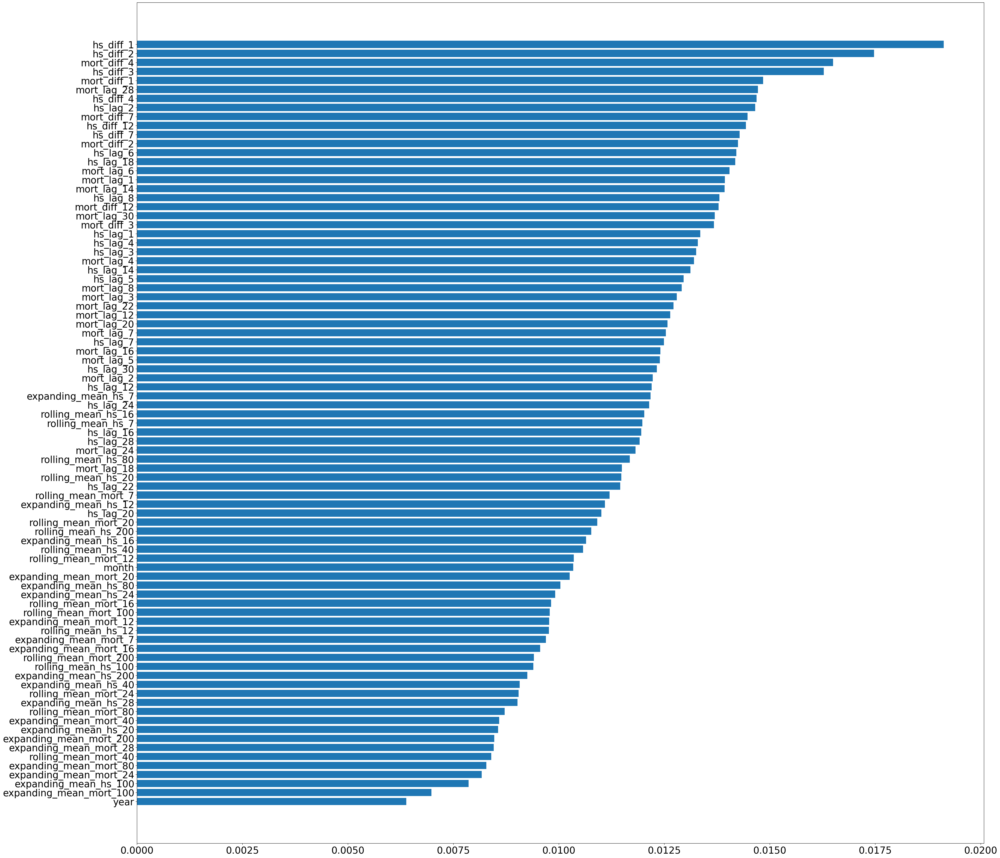

In [317]:
importances_df = pd.DataFrame({"feature_names" : model_rf.feature_names_in_, 
                               "importances" : model_rf.feature_importances_})

importances_df.sort_values(by=["importances"], ascending =True, inplace=True)                             
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="25"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])
#g.set_title("Feature importances", fontsize=25);                          


# RandomForest mort data

In [33]:
#Splitting data into x,y
y_mort = df["mort"].astype(int)

X_mort =df.drop(["Date","hs","mort"],axis=1)

In [34]:
train_size = int(len(X_mort)*0.8)
test_size_x = len(X_mort) - train_size
train_data_x_mort = X_mort[:train_size]
test_data_x_mort =  X_mort[train_size:]

In [35]:
train_size = int(len(y_mort)*0.8)
test_size_y = len(y_mort) - train_size
train_data_y_mort = y_mort[:train_size]
test_data_y_mort =  y_mort[train_size:]
train_data_y_mort

0      7
1      7
2      7
3      7
4      7
      ..
388    6
389    6
390    5
391    5
392    5
Name: mort, Length: 393, dtype: int32

In [36]:
model_rf_mort = RandomForestClassifier()


In [37]:
model_rf_mort.fit(train_data_x_mort,train_data_y_mort)

#calculate the accueacy of the classifier
y_pred = model_rf_mort.predict(test_data_x_mort)
accuracy =accuracy_score(test_data_y_mort,y_pred)
print(accuracy)


0.26262626262626265


<BarContainer object of 85 artists>

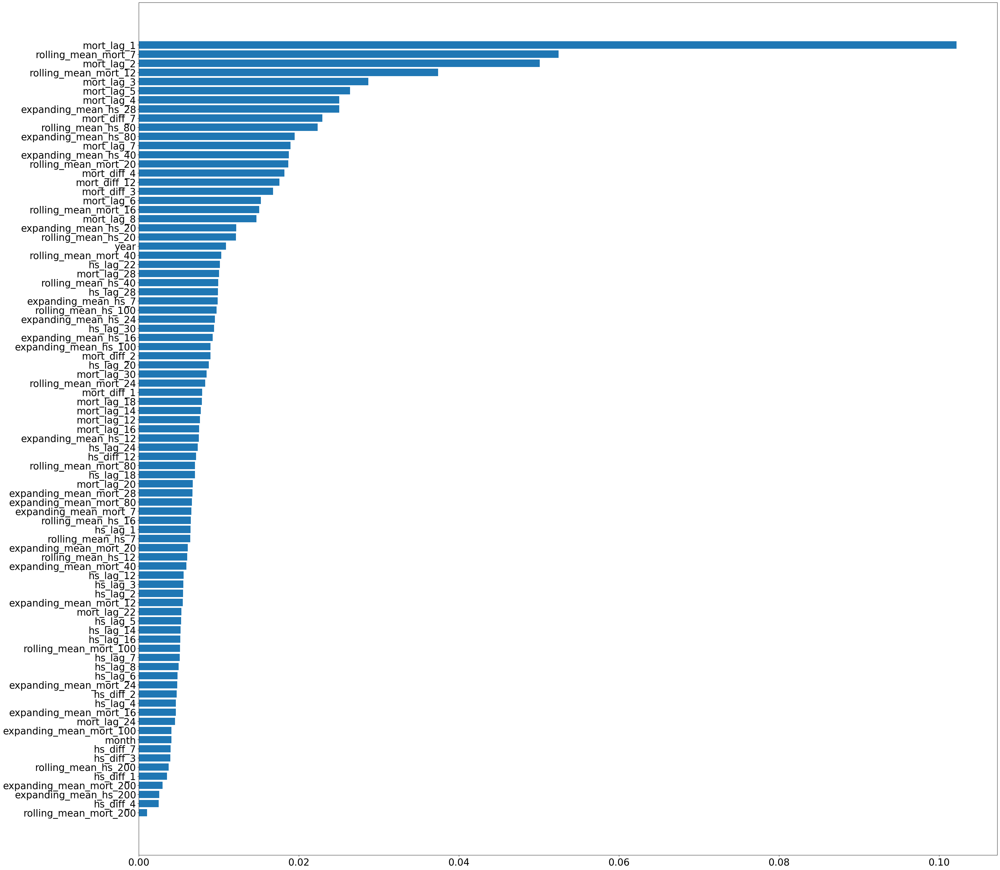

In [38]:
importances_df = pd.DataFrame({"feature_names" : model_rf_mort.feature_names_in_, 
                               "importances" : model_rf_mort.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)                  
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="25"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

In [47]:
#Correlation
cor = df.corr()
top_corr_features = cor.index
plt.figure(figsize=(100,100))
g = sb.heatmap(df_[top_corr_features].corr(),annot=True,)

C:\Users\User\AppData\Local\Temp\ipykernel_13424\1298823419.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor = df.corr()


# XGB classifier

In [65]:
#Splitting data into x,y
y =df["hs"]
X =df.drop(["Date","hs","mort"],axis=1)

In [66]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x = X[:train_size]
test_data_x =  X[train_size:]
train_data_x

,year,month,hs_lag_1,hs_lag_2,hs_lag_3,hs_lag_4,hs_lag_5,hs_lag_6,hs_lag_7,hs_lag_8,...,hs_diff_3,hs_diff_4,hs_diff_7,hs_diff_12,mort_diff_1,mort_diff_2,mort_diff_3,mort_diff_4,mort_diff_7,mort_diff_12
0,1971,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00
1,1971,5,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.12,0.00,0.00,0.00,0.00,0.00
2,1971,6,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.10,0.22,0.00,0.00,0.00,0.00
3,1971,7,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,...,97.0,0.0,0.0,0.0,0.07,0.17,0.29,0.00,0.00,0.00
4,1971,8,2083.0,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,...,109.0,172.0,0.0,0.0,0.10,0.17,0.27,0.39,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388,2003,8,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,1788.0,...,82.0,190.0,-20.0,200.0,0.63,1.03,0.78,0.45,0.34,-0.03
389,2003,9,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,...,72.0,188.0,310.0,135.0,-0.11,0.52,0.92,0.67,0.31,0.06
390,2003,10,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,...,70.0,100.0,241.0,319.0,-0.20,-0.31,0.32,0.72,0.20,-0.16
391,2003,11,1967.0,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,...,250.0,186.0,440.0,330.0,-0.02,-0.22,-0.33,0.30,0.12,-0.14


In [67]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y = y[:train_size]
test_data_y =  y[train_size:]
train_data_y

0      1986
1      2049
2      2026
3      2083
4      2158
       ... 
388    1833
389    1939
390    1967
391    2083
392    2057
Name: hs, Length: 393, dtype: int64

In [68]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
train_data_y = le.fit_transform(train_data_y)
test_data_y = le.fit_transform(test_data_y)
train_data_y.shape

(393,)

In [69]:
xgb_model = xgb.XGBClassifier()
xgb_model.fit(train_data_x,train_data_y)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', ...)

In [70]:
#calculate the accueacy of the classifier
y_pred = xgb_model.predict(test_data_x)
accuracy =accuracy_score(test_data_y,y_pred)
print(accuracy)

0.0


<BarContainer object of 85 artists>

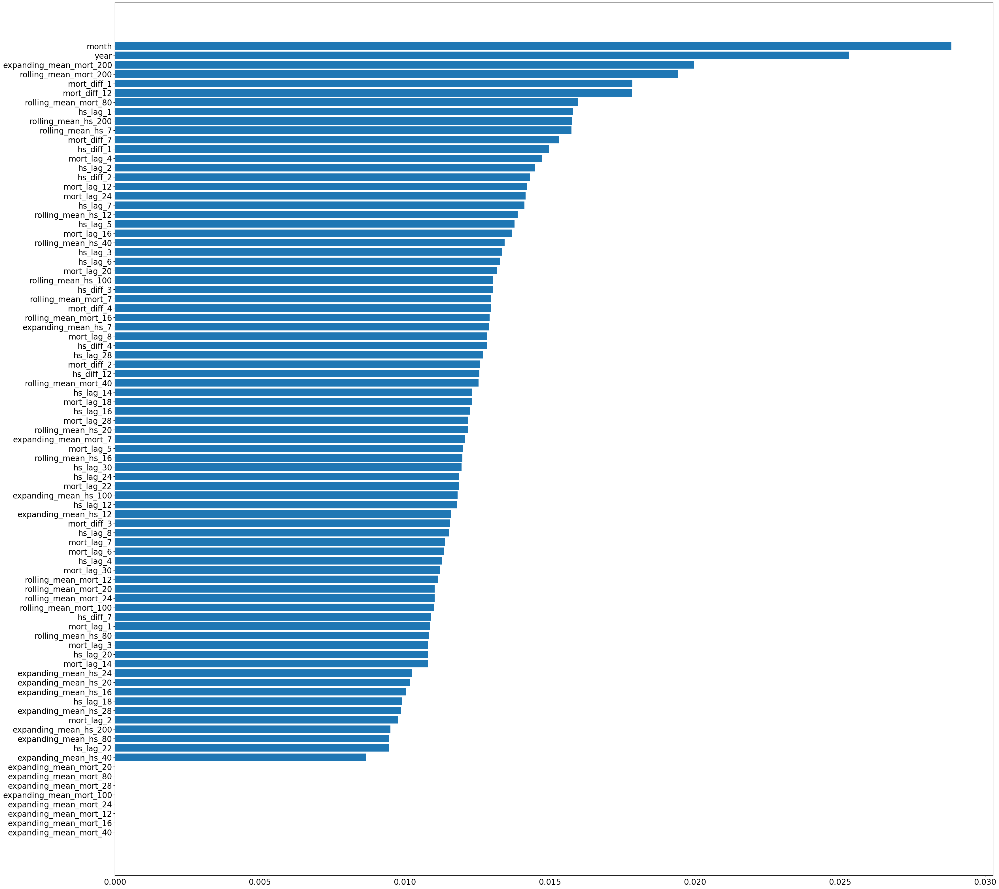

In [71]:
importances_df = pd.DataFrame({"feature_names" : xgb_model.feature_names_in_, 
                               "importances" : xgb_model.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)   
                             
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# XGB For mort

In [72]:
#Splitting data into x,y
y =df["mort"]
X =df.drop(["Date","hs","mort"],axis=1)

In [73]:
train_size = int(len(X)*0.8)
test_size = len(X) - train_size
train_data_x_hstart = X[:train_size]
test_data_x_hstart =  X[train_size:]
train_data_x_hstart

,year,month,hs_lag_1,hs_lag_2,hs_lag_3,hs_lag_4,hs_lag_5,hs_lag_6,hs_lag_7,hs_lag_8,...,hs_diff_3,hs_diff_4,hs_diff_7,hs_diff_12,mort_diff_1,mort_diff_2,mort_diff_3,mort_diff_4,mort_diff_7,mort_diff_12
0,1971,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00
1,1971,5,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.12,0.00,0.00,0.00,0.00,0.00
2,1971,6,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.10,0.22,0.00,0.00,0.00,0.00
3,1971,7,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,...,97.0,0.0,0.0,0.0,0.07,0.17,0.29,0.00,0.00,0.00
4,1971,8,2083.0,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,...,109.0,172.0,0.0,0.0,0.10,0.17,0.27,0.39,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388,2003,8,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,1788.0,...,82.0,190.0,-20.0,200.0,0.63,1.03,0.78,0.45,0.34,-0.03
389,2003,9,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,...,72.0,188.0,310.0,135.0,-0.11,0.52,0.92,0.67,0.31,0.06
390,2003,10,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,...,70.0,100.0,241.0,319.0,-0.20,-0.31,0.32,0.72,0.20,-0.16
391,2003,11,1967.0,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,...,250.0,186.0,440.0,330.0,-0.02,-0.22,-0.33,0.30,0.12,-0.14


In [74]:
train_size = int(len(y)*0.8)
test_size = len(y) - train_size
train_data_y_mort = y[:train_size]
test_data_y_mort =  y[train_size:]
train_data_y_mort

0      7.31
1      7.43
2      7.53
3      7.60
4      7.70
       ... 
388    6.26
389    6.15
390    5.95
391    5.93
392    5.88
Name: mort, Length: 393, dtype: float64

In [75]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
train_data_y_mort = le.fit_transform(train_data_y_mort)
train_data_y_mort.shape
test_data_y_mort = le.fit_transform(test_data_y_mort)

In [76]:
xgb_model = xgb.XGBClassifier()
xgb_model.fit(train_data_x_mort,train_data_y_mort)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', ...)

In [77]:
#calculate the accueacy of the classifier
y_pred = xgb_model.predict(test_data_x_mort)
accuracy =accuracy_score(test_data_y_mort,y_pred)
print(accuracy)

0.0


<BarContainer object of 85 artists>

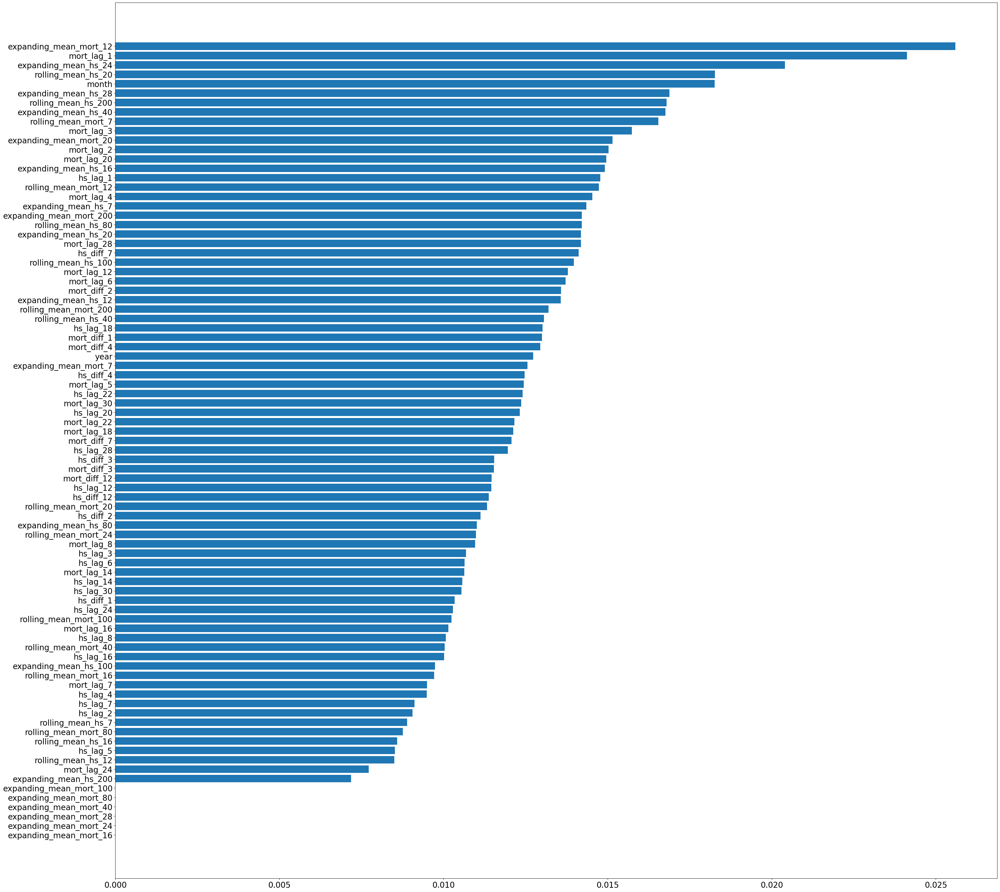

In [78]:
importances_df = pd.DataFrame({"feature_names" : xgb_model.feature_names_in_, 
                               "importances" : xgb_model.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)   

# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# Decision Tree classifier

In [79]:
#Splitting data into x,y
y =df["hs"]
X =df.drop(["Date","hs","mort"],axis=1)

In [80]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x = X[:train_size]
test_data_x =  X[train_size:]
train_data_x

,year,month,hs_lag_1,hs_lag_2,hs_lag_3,hs_lag_4,hs_lag_5,hs_lag_6,hs_lag_7,hs_lag_8,...,hs_diff_3,hs_diff_4,hs_diff_7,hs_diff_12,mort_diff_1,mort_diff_2,mort_diff_3,mort_diff_4,mort_diff_7,mort_diff_12
0,1971,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00
1,1971,5,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.12,0.00,0.00,0.00,0.00,0.00
2,1971,6,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.10,0.22,0.00,0.00,0.00,0.00
3,1971,7,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,...,97.0,0.0,0.0,0.0,0.07,0.17,0.29,0.00,0.00,0.00
4,1971,8,2083.0,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,...,109.0,172.0,0.0,0.0,0.10,0.17,0.27,0.39,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388,2003,8,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,1788.0,...,82.0,190.0,-20.0,200.0,0.63,1.03,0.78,0.45,0.34,-0.03
389,2003,9,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,...,72.0,188.0,310.0,135.0,-0.11,0.52,0.92,0.67,0.31,0.06
390,2003,10,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,...,70.0,100.0,241.0,319.0,-0.20,-0.31,0.32,0.72,0.20,-0.16
391,2003,11,1967.0,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,...,250.0,186.0,440.0,330.0,-0.02,-0.22,-0.33,0.30,0.12,-0.14


In [81]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y = y[:train_size]
test_data_y =  y[train_size:]
train_data_y

0      1986
1      2049
2      2026
3      2083
4      2158
       ... 
388    1833
389    1939
390    1967
391    2083
392    2057
Name: hs, Length: 393, dtype: int64

In [82]:
des_clf = DecisionTreeClassifier()
des_clf.fit(train_data_x,train_data_y)

DecisionTreeClassifier()

In [83]:
#calculate the accueacy of the classifier
y_pred = des_clf.predict(test_data_x)
accuracy =accuracy_score(test_data_y,y_pred)
print(accuracy)

0.0


<BarContainer object of 85 artists>

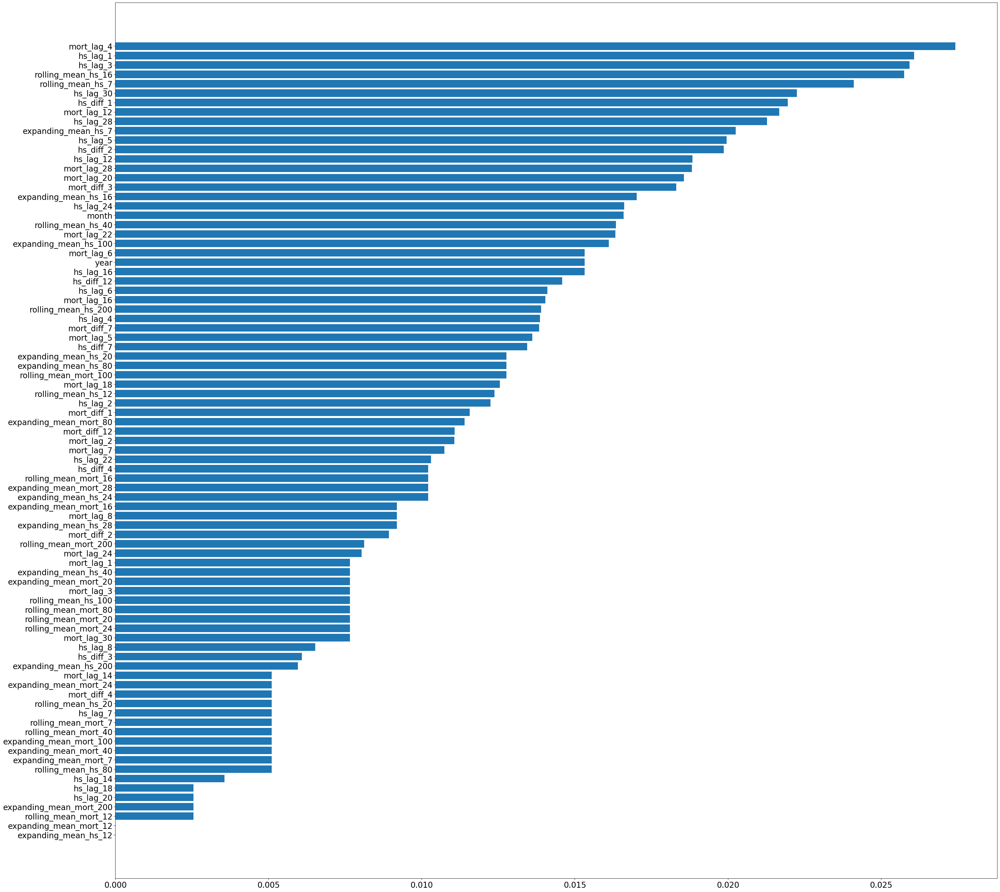

In [84]:
importances_df = pd.DataFrame({"feature_names" : des_clf.feature_names_in_, 
                               "importances" : des_clf.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)              
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# Decision Tree mort

In [85]:
#Splitting data into x,y
y =df["mort"].astype(int)
X =df.drop(["Date","hs","mort"],axis=1)

In [86]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x_hstart = X[:train_size]
test_data_x_hstart =  X[train_size:]
train_data_x_hstart

,year,month,hs_lag_1,hs_lag_2,hs_lag_3,hs_lag_4,hs_lag_5,hs_lag_6,hs_lag_7,hs_lag_8,...,hs_diff_3,hs_diff_4,hs_diff_7,hs_diff_12,mort_diff_1,mort_diff_2,mort_diff_3,mort_diff_4,mort_diff_7,mort_diff_12
0,1971,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00
1,1971,5,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.12,0.00,0.00,0.00,0.00,0.00
2,1971,6,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.10,0.22,0.00,0.00,0.00,0.00
3,1971,7,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,0.0,...,97.0,0.0,0.0,0.0,0.07,0.17,0.29,0.00,0.00,0.00
4,1971,8,2083.0,2026.0,2049.0,1986.0,0.0,0.0,0.0,0.0,...,109.0,172.0,0.0,0.0,0.10,0.17,0.27,0.39,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388,2003,8,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,1788.0,...,82.0,190.0,-20.0,200.0,0.63,1.03,0.78,0.45,0.34,-0.03
389,2003,9,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,1853.0,...,72.0,188.0,310.0,135.0,-0.11,0.52,0.92,0.67,0.31,0.06
390,2003,10,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,1629.0,...,70.0,100.0,241.0,319.0,-0.20,-0.31,0.32,0.72,0.20,-0.16
391,2003,11,1967.0,1939.0,1833.0,1897.0,1867.0,1751.0,1643.0,1726.0,...,250.0,186.0,440.0,330.0,-0.02,-0.22,-0.33,0.30,0.12,-0.14


In [87]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y_hstart = y[:train_size]
test_data_y_hstart =  y[train_size:]
train_data_y_hstart

0      7
1      7
2      7
3      7
4      7
      ..
388    6
389    6
390    5
391    5
392    5
Name: mort, Length: 393, dtype: int32

In [88]:
des_clf = DecisionTreeClassifier()
des_clf.fit(train_data_x_hstart,train_data_y_hstart)

DecisionTreeClassifier()

In [89]:
#calculate the accueacy of the classifier
y_pred = des_clf.predict(test_data_x_hstart)
accuracy =accuracy_score(test_data_y_hstart,y_pred)
print(accuracy)

0.48484848484848486


<BarContainer object of 85 artists>

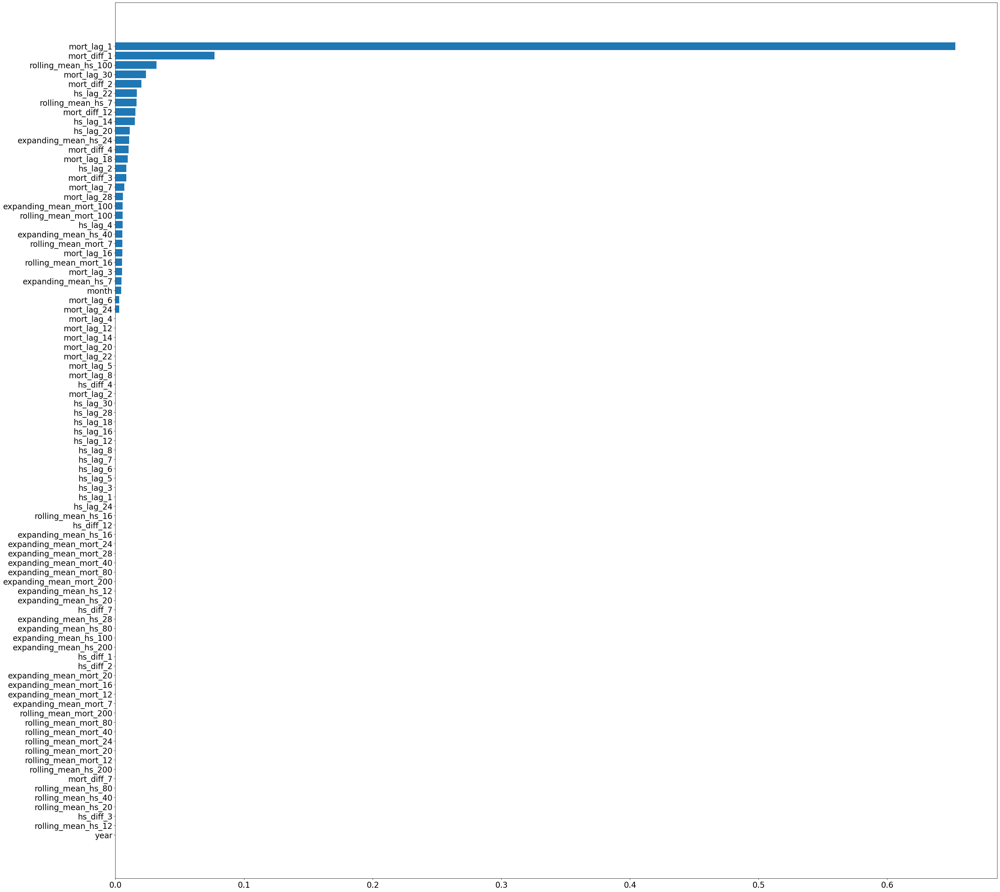

In [90]:
importances_df = pd.DataFrame({"feature_names" : des_clf.feature_names_in_, 
                               "importances" : des_clf.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)                             
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# LSTM Implementaion

# LSTM 3 features

In [140]:
#Data set_1_three_best_features
data_set_1 = df[['hs','hs_lag_1','hs_diff_2','month']]
data_set_1

,hs,hs_lag_1,hs_diff_2,month
0,1986,0.0,0.0,4
1,2049,1986.0,0.0,5
2,2026,2049.0,40.0,6
3,2083,2026.0,34.0,7
4,2158,2083.0,132.0,8
...,...,...,...,...
487,702,628.0,56.0,11
488,681,702.0,53.0,12
489,714,681.0,12.0,1
490,694,714.0,13.0,2


In [153]:
#Data set for 
data_set_2 = df[['hs','hs_lag_1','hs_diff_2','hs_diff_1','hs_lag_3','month','mort_lag_4'
                ]]
data_set_2

,hs,hs_lag_1,hs_diff_2,hs_diff_1,hs_lag_3,month,mort_lag_4
0,1986,0.0,0.0,0.0,0.0,4,0.00
1,2049,1986.0,0.0,63.0,0.0,5,0.00
2,2026,2049.0,40.0,-23.0,0.0,6,0.00
3,2083,2026.0,34.0,57.0,1986.0,7,0.00
4,2158,2083.0,132.0,75.0,2049.0,8,7.31
...,...,...,...,...,...,...,...
487,702,628.0,56.0,74.0,585.0,11,4.55
488,681,702.0,53.0,-21.0,646.0,12,4.27
489,714,681.0,12.0,33.0,628.0,1,4.11
490,694,714.0,13.0,-20.0,702.0,2,4.07


In [185]:
#Data set for 
data_set_3 = df[['hs','hs_lag_1','hs_diff_2','hs_diff_1','hs_lag_3','month','mort_lag_4',
                 'hs_diff_4','mort_diff_1','hs_diff_7'
                ]]
data_set_3

,hs,hs_lag_1,hs_diff_2,hs_diff_1,hs_lag_3,month,mort_lag_4,hs_diff_4,mort_diff_1,hs_diff_7
0,1986,0.0,0.0,0.0,0.0,4,0.00,0.0,0.00,0.0
1,2049,1986.0,0.0,63.0,0.0,5,0.00,0.0,0.12,0.0
2,2026,2049.0,40.0,-23.0,0.0,6,0.00,0.0,0.10,0.0
3,2083,2026.0,34.0,57.0,1986.0,7,0.00,0.0,0.07,0.0
4,2158,2083.0,132.0,75.0,2049.0,8,7.31,172.0,0.10,0.0
...,...,...,...,...,...,...,...,...,...,...
487,702,628.0,56.0,74.0,585.0,11,4.55,87.0,-0.08,153.0
488,681,702.0,53.0,-21.0,646.0,12,4.27,96.0,-0.03,128.0
489,714,681.0,12.0,33.0,628.0,1,4.11,68.0,-0.04,99.0
490,694,714.0,13.0,-20.0,702.0,2,4.07,66.0,-0.03,79.0


In [141]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_dataset = scaler.fit_transform(data_set_1)
scaled_dataset

array([[0.74801587, 0.        , 0.47810219, 0.27272727],
       [0.77926587, 0.79631115, 0.47810219, 0.36363636],
       [0.76785714, 0.82157177, 0.51459854, 0.45454545],
       ...,
       [0.11706349, 0.27305533, 0.48905109, 0.        ],
       [0.10714286, 0.28628709, 0.4899635 , 0.09090909],
       [0.08730159, 0.27826784, 0.42335766, 0.18181818]])

In [154]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_dataset = scaler.fit_transform(data_set_2)
scaled_dataset

array([[0.74801587, 0.        , 0.47810219, ..., 0.        , 0.27272727,
        0.        ],
       [0.77926587, 0.79631115, 0.47810219, ..., 0.        , 0.36363636,
        0.        ],
       [0.76785714, 0.82157177, 0.51459854, ..., 0.        , 0.45454545,
        0.        ],
       ...,
       [0.11706349, 0.27305533, 0.48905109, ..., 0.25180433, 0.        ,
        0.22276423],
       [0.10714286, 0.28628709, 0.4899635 , ..., 0.28147554, 0.09090909,
        0.22059621],
       [0.08730159, 0.27826784, 0.42335766, ..., 0.27305533, 0.18181818,
        0.21626016]])

In [186]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_dataset = scaler.fit_transform(data_set_3)
scaled_dataset

array([[0.74801587, 0.        , 0.47810219, ..., 0.49065421, 0.48027842,
        0.5331058 ],
       [0.77926587, 0.79631115, 0.47810219, ..., 0.49065421, 0.50812065,
        0.5331058 ],
       [0.76785714, 0.82157177, 0.51459854, ..., 0.49065421, 0.50348028,
        0.5331058 ],
       ...,
       [0.11706349, 0.27305533, 0.48905109, ..., 0.55420561, 0.47099768,
        0.60068259],
       [0.10714286, 0.28628709, 0.4899635 , ..., 0.55233645, 0.47331787,
        0.58703072],
       [0.08730159, 0.27826784, 0.42335766, ..., 0.44579439, 0.49419954,
        0.58020478]])

In [187]:
def create_dataset(scaled_data):
    window_size = 6
    x_set =[]
    y_set =[]
    
    for i in range(window_size,len(scaled_data)):
        x_set.append(scaled_data[i-window_size:i,:])
        y_set.append(scaled_data[i,0:1])
        
    return x_set, y_set

In [188]:
#get the x data and y data 
x_set, y_set = create_dataset(scaled_dataset)
x_data = np.array(x_set)
y_data = np.array(y_set)
print(x_data.shape)
print(y_data.shape)

(486, 6, 10)
(486, 1)


In [189]:
#Split data
#x_data
train_size = int(len(x_data)*0.8)
test_size_x = len(x_data) - train_size
train_data_x = x_data[:train_size]
test_data_x =  x_data[train_size:]

print(train_data_x.shape)
print(test_data_x.shape)

#y_data
train_size = int(len(y_data)*0.8)
test_size_y = len(y_data) - train_size
train_data_y = y_data[:train_size]
test_data_y =  y_data[train_size:]
print(train_data_y.shape)
print(test_data_y.shape)

(388, 6, 10)
(98, 6, 10)
(388, 1)
(98, 1)


In [190]:
train_data_x.shape[1]
train_data_x.shape[2]

10

In [191]:
model = Sequential()

model.add(LSTM(units = 512, return_sequences = True, input_shape=(train_data_x.shape[1], train_data_x.shape[2])))
model.add(Dropout(0.2))

#model.add(LSTM(units = 256, return_sequences = True))
#model.add(Dropout(0.2))

#model.add(LSTM(units = 256, return_sequences = True))
#model.add(Dropout(0.2))

model.add(LSTM(units = 256))
model.add(Dropout(0.2))

model.add(Dense(units = 1))


model.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [192]:
#model fit
history = model.fit(train_data_x, train_data_y, epochs = 200, batch_size=80)

Epoch 1/200
5/5 [==============================] - 4s 96ms/step - loss: 0.1057
Epoch 2/200
5/5 [==============================] - 0s 97ms/step - loss: 0.0462
Epoch 3/200
5/5 [==============================] - 1s 101ms/step - loss: 0.0206
Epoch 4/200
5/5 [==============================] - 0s 98ms/step - loss: 0.0134
Epoch 5/200
5/5 [==============================] - 0s 97ms/step - loss: 0.0129
Epoch 6/200
5/5 [==============================] - 0s 98ms/step - loss: 0.0102
Epoch 7/200
5/5 [==============================] - 1s 98ms/step - loss: 0.0081
Epoch 8/200
5/5 [==============================] - 1s 98ms/step - loss: 0.0075
Epoch 9/200
5/5 [==============================] - 0s 98ms/step - loss: 0.0069
Epoch 10/200
5/5 [==============================] - 0s 98ms/step - loss: 0.0061
Epoch 11/200
5/5 [==============================] - 0s 98ms/step - loss: 0.0058
Epoch 12/200
5/5 [==============================] - 1s 100ms/step - loss: 0.0053
Epoch 13/200
5/5 [=============================

In [193]:
#Get predictions
y_predicted = model.predict(test_data_x)

4/4 [==============================] - 1s 19ms/step


In [194]:
data = scaled_dataset[:98,:]
y_pred_act = np.concatenate((y_predicted,data[:98,1:]),axis=1)
y_test_act = np.concatenate((test_data_y,data[:98,1:]),axis=1)

In [195]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y, y_predicted)

rmse = np.sqrt(mse)
rmse

0.05603605995626761

In [196]:
Y_tested = scaler.inverse_transform(y_test_act)
Y_predicted = scaler.inverse_transform(y_pred_act)

Y_predicted = Y_predicted[:,0:1]
Y_tested = Y_tested[:,0:1]
Y_tested.shape

(98, 1)

In [197]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(Y_tested,Y_predicted)

rmse = np.sqrt(mse)
rmse

112.96869687183549

# mort data

In [204]:
#Data set for three features
data_set_1_mort = df[['mort','mort_lag_1','mort_diff_1','expanding_mean_mort_12']]
data_set_1_mort

,mort,mort_lag_1,mort_diff_1,expanding_mean_mort_12
0,7.31,0.00,0.00,0.000000
1,7.43,7.31,0.12,0.000000
2,7.53,7.43,0.10,0.000000
3,7.60,7.53,0.07,0.000000
4,7.70,7.60,0.10,0.000000
...,...,...,...,...
487,3.99,4.07,-0.08,8.799570
488,3.96,3.99,-0.03,8.789673
489,3.92,3.96,-0.04,8.779735
490,3.89,3.92,-0.03,8.769776


In [218]:
#Data set for 
data_set_2_mort = df[['mort','mort_lag_1','mort_diff_1','expanding_mean_mort_12','mort_lag_2','rolling_mean_mort_7',
                      'rolling_mean_mort_12'
                ]]
data_set_2_mort 

,mort,mort_lag_1,mort_diff_1,expanding_mean_mort_12,mort_lag_2,rolling_mean_mort_7,rolling_mean_mort_12
0,7.31,0.00,0.00,0.000000,0.00,0.000000,0.000000
1,7.43,7.31,0.12,0.000000,0.00,0.000000,0.000000
2,7.53,7.43,0.10,0.000000,7.31,0.000000,0.000000
3,7.60,7.53,0.07,0.000000,7.43,0.000000,0.000000
4,7.70,7.60,0.10,0.000000,7.53,0.000000,0.000000
...,...,...,...,...,...,...,...
487,3.99,4.07,-0.08,8.799570,4.11,4.305714,4.520000
488,3.96,3.99,-0.03,8.789673,4.07,4.208571,4.457500
489,3.92,3.96,-0.04,8.779735,3.99,4.124286,4.387500
490,3.89,3.92,-0.03,8.769776,3.96,4.030000,4.299167


In [230]:
#Data set for Random Forest
data_set_3_mort  = df[['mort','mort_lag_1','mort_diff_1','expanding_mean_mort_12','mort_lag_2','rolling_mean_mort_7',
                      'rolling_mean_mort_12','mort_lag_3','mort_diff_2','mort_lag_5']]
data_set_3_mort 

,mort,mort_lag_1,mort_diff_1,expanding_mean_mort_12,mort_lag_2,rolling_mean_mort_7,rolling_mean_mort_12,mort_lag_3,mort_diff_2,mort_lag_5
0,7.31,0.00,0.00,0.000000,0.00,0.000000,0.000000,0.00,0.00,0.00
1,7.43,7.31,0.12,0.000000,0.00,0.000000,0.000000,0.00,0.00,0.00
2,7.53,7.43,0.10,0.000000,7.31,0.000000,0.000000,0.00,0.22,0.00
3,7.60,7.53,0.07,0.000000,7.43,0.000000,0.000000,7.31,0.17,0.00
4,7.70,7.60,0.10,0.000000,7.53,0.000000,0.000000,7.43,0.17,0.00
...,...,...,...,...,...,...,...,...,...,...
487,3.99,4.07,-0.08,8.799570,4.11,4.305714,4.520000,4.27,-0.12,4.51
488,3.96,3.99,-0.03,8.789673,4.07,4.208571,4.457500,4.11,-0.11,4.55
489,3.92,3.96,-0.04,8.779735,3.99,4.124286,4.387500,4.07,-0.07,4.27
490,3.89,3.92,-0.03,8.769776,3.96,4.030000,4.299167,3.99,-0.07,4.11


In [205]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_dataset = scaler.fit_transform(data_set_1_mort)
scaled_dataset

array([[0.23489011, 0.        , 0.48027842, 0.        ],
       [0.24313187, 0.39620596, 0.50812065, 0.        ],
       [0.25      , 0.40271003, 0.50348028, 0.        ],
       ...,
       [0.00206044, 0.21463415, 0.47099768, 0.79031141],
       [0.        , 0.21246612, 0.47331787, 0.78941497],
       [0.00412088, 0.21084011, 0.49419954, 0.78853316]])

In [219]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_dataset = scaler.fit_transform(data_set_2_mort)
scaled_dataset

array([[0.23489011, 0.        , 0.48027842, ..., 0.        , 0.        ,
        0.        ],
       [0.24313187, 0.39620596, 0.50812065, ..., 0.        , 0.        ,
        0.        ],
       [0.25      , 0.40271003, 0.50348028, ..., 0.39620596, 0.        ,
        0.        ],
       ...,
       [0.00206044, 0.21463415, 0.47099768, ..., 0.21626016, 0.2334816 ,
        0.25323457],
       [0.        , 0.21246612, 0.47331787, ..., 0.21463415, 0.22814395,
        0.24813621],
       [0.00412088, 0.21084011, 0.49419954, ..., 0.21246612, 0.225556  ,
        0.24385551]])

In [231]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_dataset = scaler.fit_transform(data_set_3_mort)
scaled_dataset

array([[0.23489011, 0.        , 0.48027842, ..., 0.        , 0.52387844,
        0.        ],
       [0.24313187, 0.39620596, 0.50812065, ..., 0.        , 0.52387844,
        0.        ],
       [0.25      , 0.40271003, 0.50348028, ..., 0.        , 0.55571635,
        0.        ],
       ...,
       [0.00206044, 0.21463415, 0.47099768, ..., 0.22059621, 0.51374819,
        0.23143631],
       [0.        , 0.21246612, 0.47331787, ..., 0.21626016, 0.51374819,
        0.22276423],
       [0.00412088, 0.21084011, 0.49419954, ..., 0.21463415, 0.52821997,
        0.22059621]])

In [232]:
#get the x data and y data 
x_set, y_set = create_dataset(scaled_dataset)
x_data = np.array(x_set)
y_data = np.array(y_set)
print(x_data.shape)
print(y_data.shape)

(486, 6, 10)
(486, 1)


In [233]:
#Split data
#x_data
train_size = int(len(x_data)*0.8)
test_size_x = len(x_data) - train_size
train_data_x = x_data[:train_size]
test_data_x =  x_data[train_size:]

print(train_data_x.shape)
print(test_data_x.shape)

#y_data
train_size = int(len(y_data)*0.8)
test_size_y = len(y_data) - train_size
train_data_y = y_data[:train_size]
test_data_y =  y_data[train_size:]
print(train_data_y.shape)
print(test_data_y.shape)

(388, 6, 10)
(98, 6, 10)
(388, 1)
(98, 1)


In [234]:
train_data_x.shape[1]
train_data_x.shape[2]

10

In [235]:
model = Sequential()

model.add(LSTM(units = 512, return_sequences = True, input_shape=(train_data_x.shape[1], train_data_x.shape[2])))
model.add(Dropout(0.2))

#model.add(LSTM(units = 256, return_sequences = True))
#model.add(Dropout(0.2))

#model.add(LSTM(units = 256, return_sequences = True))
#model.add(Dropout(0.2))

model.add(LSTM(units = 256))
model.add(Dropout(0.2))

model.add(Dense(units = 1))


model.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [236]:
#model fit
history = model.fit(train_data_x, train_data_y, epochs = 200, batch_size=80)

Epoch 1/200
5/5 [==============================] - 9s 145ms/step - loss: 0.0568
Epoch 2/200
5/5 [==============================] - 1s 153ms/step - loss: 0.0178
Epoch 3/200
5/5 [==============================] - 1s 156ms/step - loss: 0.0083
Epoch 4/200
5/5 [==============================] - 1s 151ms/step - loss: 0.0054
Epoch 5/200
5/5 [==============================] - 1s 156ms/step - loss: 0.0056
Epoch 6/200
5/5 [==============================] - 1s 155ms/step - loss: 0.0049
Epoch 7/200
5/5 [==============================] - 1s 159ms/step - loss: 0.0038
Epoch 8/200
5/5 [==============================] - 1s 161ms/step - loss: 0.0037
Epoch 9/200
5/5 [==============================] - 1s 157ms/step - loss: 0.0034
Epoch 10/200
5/5 [==============================] - 1s 161ms/step - loss: 0.0038
Epoch 11/200
5/5 [==============================] - 1s 161ms/step - loss: 0.0037
Epoch 12/200
5/5 [==============================] - 1s 162ms/step - loss: 0.0034
Epoch 13/200
5/5 [===================

5/5 [==============================] - 1s 158ms/step - loss: 0.0010
Epoch 103/200
5/5 [==============================] - 1s 173ms/step - loss: 0.0011
Epoch 104/200
5/5 [==============================] - 1s 175ms/step - loss: 0.0010
Epoch 105/200
5/5 [==============================] - 1s 166ms/step - loss: 0.0012
Epoch 106/200
5/5 [==============================] - 1s 165ms/step - loss: 0.0012
Epoch 107/200
5/5 [==============================] - 1s 169ms/step - loss: 0.0012
Epoch 108/200
5/5 [==============================] - 1s 168ms/step - loss: 0.0012
Epoch 109/200
5/5 [==============================] - 1s 164ms/step - loss: 0.0014
Epoch 110/200
5/5 [==============================] - 1s 162ms/step - loss: 0.0014
Epoch 111/200
5/5 [==============================] - 1s 167ms/step - loss: 0.0010
Epoch 112/200
5/5 [==============================] - 1s 169ms/step - loss: 0.0012
Epoch 113/200
5/5 [==============================] - 1s 169ms/step - loss: 9.2486e-04
Epoch 114/200
5/5 [=======

In [237]:
#Get predictions
y_predicted = model.predict(test_data_x)

4/4 [==============================] - 1s 26ms/step


In [238]:
data = scaled_dataset[:98,:]
y_pred_act = np.concatenate((y_predicted,data[:98,1:]),axis=1)
y_test_act = np.concatenate((test_data_y,data[:98,1:]),axis=1)

In [239]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y, y_predicted)

rmse = np.sqrt(mse)
rmse

0.012982790897294151

In [240]:
Y_tested = scaler.inverse_transform(y_test_act)
Y_predicted = scaler.inverse_transform(y_pred_act)

Y_predicted = Y_predicted[:,0:1]
Y_tested = Y_tested[:,0:1]
Y_tested.shape

(98, 1)

In [241]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(Y_tested,Y_predicted)

rmse = np.sqrt(mse)
rmse

0.18902943546460285

In [203]:
#Data set for Random Forest
data_set_1 = df[['hsold','hstart','hsold_lag_1','hsold_lag_2','hsold_lag_12','hsold_lag_24',
               'hsold_lag_22',
               'rolling_mean_hsold_7',
               'hstart_lag_1','hstart_lag_2','hstart_lag_3',
                'hstart_lag_4','hstart_lag_5','hstart_lag_6','hstart_lag_7','hstart_lag_14',
               'hstart_lag_18','hstart_lag_28',
               'rolling_mean_hstart_16','hsold_diff_1','hstart_diff_4','hstart_diff_3',
            
              ]]
data_set_1

,hsold,hstart,hsold_lag_1,hsold_lag_2,hsold_lag_12,hsold_lag_24,hsold_lag_22,rolling_mean_hsold_7,hstart_lag_1,hstart_lag_2,...,hstart_lag_5,hstart_lag_6,hstart_lag_7,hstart_lag_14,hstart_lag_18,hstart_lag_28,rolling_mean_hstart_16,hsold_diff_1,hstart_diff_4,hstart_diff_3
0,42,79.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0
1,35,89.6,42.0,0.0,0.0,0.0,0.0,0.000000,79.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,-7.0,0.0,0.0
2,44,124.8,35.0,42.0,0.0,0.0,0.0,0.000000,89.6,79.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,9.0,0.0,0.0
3,52,164.2,44.0,35.0,0.0,0.0,0.0,0.000000,124.8,89.6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,8.0,0.0,85.2
4,58,172.7,52.0,44.0,0.0,0.0,0.0,0.000000,164.2,124.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,6.0,93.7,83.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590,34,58.0,30.0,23.0,28.0,36.0,26.0,26.142857,49.7,47.2,...,53.2,58.8,54.5,40.2,53.0,42.3,49.84375,4.0,5.0,15.3
591,34,66.8,34.0,30.0,30.0,41.0,28.0,27.571429,58.0,49.7,...,53.0,53.2,58.8,35.4,45.4,36.6,51.90625,0.0,24.1,19.6
592,35,67.8,34.0,34.0,28.0,26.0,26.0,29.000000,66.8,58.0,...,42.7,53.0,53.2,49.9,40.6,38.9,53.63125,1.0,20.6,18.1
593,34,74.7,35.0,34.0,28.0,28.0,23.0,30.571429,67.8,66.8,...,47.2,42.7,53.0,49.0,33.8,40.7,56.08750,-1.0,25.0,16.7


In [153]:
#Data set for Random Forest
data_set = df[['hsold','hstart','hsold_lag_1','hsold_lag_2','hsold_lag_12','rolling_mean_hsold_16',
               
               'hstart_lag_1','hstart_lag_2','hstart_lag_3',  'hstart_lag_12',
               'hsold_diff_1','hstart_diff_4','hstart_diff_3',
              ]]
data_set

,hsold,hstart,hsold_lag_1,hsold_lag_2,hsold_lag_12,rolling_mean_hsold_16,hstart_lag_1,hstart_lag_2,hstart_lag_3,hstart_lag_12,hsold_diff_1,hstart_diff_4,hstart_diff_3
0,42,79.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,35,89.6,42.0,0.0,0.0,0.0000,79.0,0.0,0.0,0.0,-7.0,0.0,0.0
2,44,124.8,35.0,42.0,0.0,0.0000,89.6,79.0,0.0,0.0,9.0,0.0,0.0
3,52,164.2,44.0,35.0,0.0,0.0000,124.8,89.6,79.0,0.0,8.0,0.0,85.2
4,58,172.7,52.0,44.0,0.0,0.0000,164.2,124.8,89.6,0.0,6.0,93.7,83.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
590,34,58.0,30.0,23.0,28.0,25.9375,49.7,47.2,42.7,49.9,4.0,5.0,15.3
591,34,66.8,34.0,30.0,30.0,26.6250,58.0,49.7,47.2,49.0,0.0,24.1,19.6
592,35,67.8,34.0,34.0,28.0,27.5000,66.8,58.0,49.7,54.0,1.0,20.6,18.1
593,34,74.7,35.0,34.0,28.0,28.2500,67.8,66.8,58.0,60.5,-1.0,25.0,16.7


In [224]:
#Data set for Random Forest
data_set_m = df[['hsold','hstart','hsold_lag_1','hsold_lag_2','hsold_lag_3',
               
               'hstart_lag_1','hstart_lag_2','hstart_lag_3',  
               'hsold_diff_1','hstart_diff_1']]
data_set_m

,hsold,hstart,hsold_lag_1,hsold_lag_2,hsold_lag_3,hstart_lag_1,hstart_lag_2,hstart_lag_3,hsold_diff_1,hstart_diff_1
0,42,79.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,35,89.6,42.0,0.0,0.0,79.0,0.0,0.0,-7.0,10.6
2,44,124.8,35.0,42.0,0.0,89.6,79.0,0.0,9.0,35.2
3,52,164.2,44.0,35.0,42.0,124.8,89.6,79.0,8.0,39.4
4,58,172.7,52.0,44.0,35.0,164.2,124.8,89.6,6.0,8.5
...,...,...,...,...,...,...,...,...,...,...
590,34,58.0,30.0,23.0,24.0,49.7,47.2,42.7,4.0,8.3
591,34,66.8,34.0,30.0,23.0,58.0,49.7,47.2,0.0,8.8
592,35,67.8,34.0,34.0,30.0,66.8,58.0,49.7,1.0,1.0
593,34,74.7,35.0,34.0,34.0,67.8,66.8,58.0,-1.0,6.9


In [191]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_dataset = scaler.fit_transform(data_set_2 )
scaled_dataset

array([[0.20560748, 0.        , 0.43902439, ..., 0.        , 0.        ,
        0.        ],
       [0.14018692, 0.33070866, 0.43902439, ..., 0.        , 0.        ,
        0.        ],
       [0.22429907, 0.27559055, 0.69880885, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.14018692, 0.26771654, 0.49461146, ..., 0.22047244, 0.24938575,
        0.18247863],
       [0.13084112, 0.27559055, 0.48383437, ..., 0.22047244, 0.26289926,
        0.2017094 ],
       [0.13084112, 0.26771654, 0.46114577, ..., 0.21259843, 0.27518428,
        0.21239316]])

In [192]:
def create_dataset(scaled_data):
    window_size = 6
    x_set =[]
    y_set =[]
    
    for i in range(window_size,len(scaled_data)):
        x_set.append(scaled_data[i-window_size:i,:])
        y_set.append(scaled_data[i,0:1])
        
    return x_set, y_set

In [193]:
#get the x data and y data 
x_set, y_set = create_dataset(scaled_dataset)
x_data = np.array(x_set)
y_data = np.array(y_set)
print(x_data.shape)
print(y_data.shape)

(589, 6, 7)
(589, 1)


In [194]:
y_data

array([[0.39252336],
       [0.3364486 ],
       [0.27102804],
       [0.22429907],
       [0.17757009],
       [0.10280374],
       [0.17757009],
       [0.24299065],
       [0.30841121],
       [0.27102804],
       [0.29906542],
       [0.30841121],
       [0.31775701],
       [0.3364486 ],
       [0.26168224],
       [0.23364486],
       [0.1588785 ],
       [0.12149533],
       [0.1682243 ],
       [0.22429907],
       [0.30841121],
       [0.27102804],
       [0.31775701],
       [0.34579439],
       [0.28971963],
       [0.35514019],
       [0.26168224],
       [0.22429907],
       [0.20560748],
       [0.1588785 ],
       [0.20560748],
       [0.21495327],
       [0.30841121],
       [0.27102804],
       [0.27102804],
       [0.18691589],
       [0.18691589],
       [0.14953271],
       [0.08411215],
       [0.10280374],
       [0.05607477],
       [0.02803738],
       [0.08411215],
       [0.11214953],
       [0.19626168],
       [0.22429907],
       [0.27102804],
       [0.252

In [195]:
x_data

array([[[0.20560748, 0.        , 0.43902439, ..., 0.        ,
         0.        , 0.        ],
        [0.14018692, 0.33070866, 0.43902439, ..., 0.        ,
         0.        , 0.        ],
        [0.22429907, 0.27559055, 0.69880885, ..., 0.        ,
         0.        , 0.        ],
        [0.29906542, 0.34645669, 0.86216676, ..., 0.        ,
         0.        , 0.        ],
        [0.35514019, 0.40944882, 0.71072036, ..., 0.        ,
         0.        , 0.        ],
        [0.26168224, 0.45669291, 0.38230289, ..., 0.        ,
         0.        , 0.33760684]],

       [[0.14018692, 0.33070866, 0.43902439, ..., 0.        ,
         0.        , 0.        ],
        [0.22429907, 0.27559055, 0.69880885, ..., 0.        ,
         0.        , 0.        ],
        [0.29906542, 0.34645669, 0.86216676, ..., 0.        ,
         0.        , 0.        ],
        [0.35514019, 0.40944882, 0.71072036, ..., 0.        ,
         0.        , 0.        ],
        [0.26168224, 0.45669291, 0.382

In [196]:
#Split data
#x_data
train_size = int(len(x_data)*0.8)
test_size_x = len(x_data) - train_size
train_data_x = x_data[:train_size]
test_data_x =  x_data[train_size:]

print(train_data_x.shape)
print(test_data_x.shape)

#y_data
train_size = int(len(y_data)*0.8)
test_size_y = len(y_data) - train_size
train_data_y = y_data[:train_size]
test_data_y =  y_data[train_size:]
print(train_data_y.shape)
print(test_data_y.shape)

(471, 6, 7)
(118, 6, 7)
(471, 1)
(118, 1)


In [197]:
train_data_x.shape[1]
train_data_x.shape[2]

7

In [198]:
model = Sequential()

model.add(LSTM(units = 512, return_sequences = True, input_shape=(train_data_x.shape[1], train_data_x.shape[2])))
model.add(Dropout(0.2))

#model.add(LSTM(units = 256, return_sequences = True))
#model.add(Dropout(0.2))

#model.add(LSTM(units = 256, return_sequences = True))
#model.add(Dropout(0.2))

model.add(LSTM(units = 256))
model.add(Dropout(0.2))

model.add(Dense(units = 1))


model.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [199]:
#model fit
history = model.fit(train_data_x, train_data_y, epochs = 200, batch_size=80)

Epoch 1/200
6/6 [==============================] - 4s 91ms/step - loss: 0.0444
Epoch 2/200
6/6 [==============================] - 1s 90ms/step - loss: 0.0208
Epoch 3/200
6/6 [==============================] - 1s 91ms/step - loss: 0.0128
Epoch 4/200
6/6 [==============================] - 1s 92ms/step - loss: 0.0113
Epoch 5/200
6/6 [==============================] - 1s 91ms/step - loss: 0.0098
Epoch 6/200
6/6 [==============================] - 1s 92ms/step - loss: 0.0092
Epoch 7/200
6/6 [==============================] - 1s 107ms/step - loss: 0.0084
Epoch 8/200
6/6 [==============================] - 1s 112ms/step - loss: 0.0071
Epoch 9/200
6/6 [==============================] - 1s 112ms/step - loss: 0.0073
Epoch 10/200
6/6 [==============================] - 1s 112ms/step - loss: 0.0073
Epoch 11/200
6/6 [==============================] - 1s 103ms/step - loss: 0.0075
Epoch 12/200
6/6 [==============================] - 1s 103ms/step - loss: 0.0060
Epoch 13/200
6/6 [=========================

In [218]:
#Get predictions
y_predicted = model.predict(test_data_x)

4/4 [==============================] - 1s 21ms/step


In [219]:
data = scaled_dataset[:118,:]
y_pred_act = np.concatenate((y_predicted,data[:118,1:]),axis=1)
y_test_act = np.concatenate((test_data_y,data[:118,1:]),axis=1)

In [220]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y, y_predicted)

rmse = np.sqrt(mse)
rmse

0.05491986029655847

In [221]:
Y_tested = scaler.inverse_transform(y_test_act)
Y_predicted = scaler.inverse_transform(y_pred_act)

Y_predicted = Y_predicted[:,0:1]
Y_tested = Y_tested[:,0:1]
Y_tested.shape

(118, 1)

In [222]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(Y_tested,Y_predicted)

rmse = np.sqrt(mse)
rmse

5.876425051731759

# Model_XGB_Result

In [293]:
#Data set for XGB
data_set_XGB = df[['hsold','hstart','hsold_lag_1','hsold_lag_7',
                  'rolling_mean_hsold_12','expanding_mean_hsold_80','expanding_mean_hstart_40','expanding_mean_hstart_80',
                   'expanding_mean_hsold_16'
                  ]]
data_set_XGB

,hsold,hstart,hsold_lag_1,hsold_lag_7,rolling_mean_hsold_12,expanding_mean_hsold_80,expanding_mean_hstart_40,expanding_mean_hstart_80,expanding_mean_hsold_16
0,42,79.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
1,35,89.6,42.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
2,44,124.8,35.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
3,52,164.2,44.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
4,58,172.7,52.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
590,34,58.0,30.0,25.0,26.750000,55.746193,123.623858,123.623858,55.746193
591,34,66.8,34.0,24.0,27.083333,55.709459,123.527872,123.527872,55.709459
592,35,67.8,34.0,25.0,27.666667,55.674536,123.433895,123.433895,55.674536
593,34,74.7,35.0,23.0,28.166667,55.638047,123.351852,123.351852,55.638047


# Decision Tree

In [426]:
#Data set for XGB
data_set_Deci_tree = df[['hsold','hstart','hsold_lag_1','hsold_lag_2','hsold_lag_7','hsold_lag_30','hstart_lag_1',
                         'hstart_lag_2','hstart_lag_4','hstart_lag_5'
                         
                  
                  ]]
data_set_Deci_tree

,hsold,hstart,hsold_lag_1,hsold_lag_2,hsold_lag_7,hsold_lag_30,hstart_lag_1,hstart_lag_2,hstart_lag_4,hstart_lag_5
0,42,79.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,35,89.6,42.0,0.0,0.0,0.0,79.0,0.0,0.0,0.0
2,44,124.8,35.0,42.0,0.0,0.0,89.6,79.0,0.0,0.0
3,52,164.2,44.0,35.0,0.0,0.0,124.8,89.6,0.0,0.0
4,58,172.7,52.0,44.0,0.0,0.0,164.2,124.8,79.0,0.0
...,...,...,...,...,...,...,...,...,...,...
590,34,58.0,30.0,23.0,25.0,30.0,49.7,47.2,53.0,53.2
591,34,66.8,34.0,30.0,24.0,33.0,58.0,49.7,42.7,53.0
592,35,67.8,34.0,34.0,25.0,26.0,66.8,58.0,47.2,42.7
593,34,74.7,35.0,34.0,23.0,24.0,67.8,66.8,49.7,47.2
